<a href="https://colab.research.google.com/github/KauaHenSilva/python_animal_motion_detection/blob/main/main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup

## Pacotes externos

In [210]:
import os

In [211]:
if os.path.exists('python_download_file_drive'):
  !cd python_download_file_drive && git pull
else:
  !git clone https://github.com/KauaHenSilva/python_download_file_drive

Already up to date.


In [212]:
%pip install --upgrade --quiet -r python_download_file_drive/requirements.txt

## baixando arquivos requeridos

In [213]:
%%capture
!python "python_download_file_drive/main.py" "https://drive.google.com/drive/folders/13LvSXf8YsCxARsMxiRX8RZBRUGzW7RaY?usp=drive_link" arq --folder

## Função de exibição de video

In [214]:
%pip install --upgrade --quiet ffmpeg-python
import ffmpeg
import base64
import io
from IPython.display import HTML
import tempfile

In [244]:
def compress_video(input_file, output_file, resolution=(640, 360), bitrate="500k", tempo_max=None):
    if tempo_max:
        input_vid = ffmpeg.input(input_file, t=tempo_max)
    else:
        input_vid = ffmpeg.input(input_file)
    input_vid.output(output_file, vf=f'scale={resolution[0]}:{resolution[1]}', video_bitrate=bitrate).run(overwrite_output=True, quiet=True)

def show_video(name_file, tempo_max=None):
    with tempfile.NamedTemporaryFile(suffix=".mp4", delete=False) as temp_video:
        compressed_file = temp_video.name
        compress_video(name_file, compressed_file, tempo_max=tempo_max)
    name_file = compressed_file

    video = io.open(name_file, 'r+b').read()
    encoded = base64.b64encode(video).decode('ascii')

    return f'''
    <video width="320" height="180" controls>
        <source src="data:video/mp4;base64,{encoded}" type="video/mp4">
    </video>'''

def show_videos_side_by_side(*videos, tempo_max=None):
    video_htmls = [show_video(video, tempo_max) for video in videos]

    html_code = f"""
    <div id="videos-container" style="display: flex; gap: 10px;">
        {''.join(video_htmls)}
    </div>
    <button onclick="playAllVideos()">Play All</button>

    <script>
    function playAllVideos() {{
        let videos = document.querySelectorAll("video");
        videos.forEach(video => {{
            video.currentTime = 0;
            video.play().catch(error => console.error("Erro ao iniciar o vídeo:", error));
        }});
    }}
    </script>
    """

    display(HTML(html_code))



# MOG, GMC, KNN e CNT

In [216]:
import numpy as np
import cv2
import sys
from random import randint
from google.colab.patches import cv2_imshow

In [217]:
path_video = "/content/arq/Curso_Subtraction/videos/Animal_1.mp4" #@param {type:"string"}

In [218]:
BGS_types = ["GMG", "MOG", "MOG2", "KNN", "CNT"]

In [219]:
TEXT_COLOR = (randint(0, 255), randint(0, 255), randint(0, 255))
BORDER_COLOR = (randint(0, 255), randint(0, 255), randint(0, 255))
FONT = cv2.FONT_HERSHEY_SIMPLEX

In [220]:
def getKernel(KERNEL_TYPE):
  if KERNEL_TYPE == "dilation":
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
  elif KERNEL_TYPE == "opening":
    kernel = np.ones((3, 3), np.uint8)
  elif KERNEL_TYPE == "closing":
    kernel = np.ones((3, 3), np.uint8)
  else:
    raise ValueError("Invalid kernel type")
  return kernel

getKernel("dilation")

array([[0, 1, 0],
       [1, 1, 1],
       [0, 1, 0]], dtype=uint8)

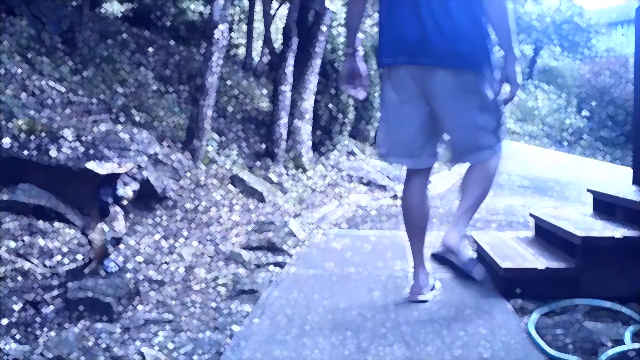

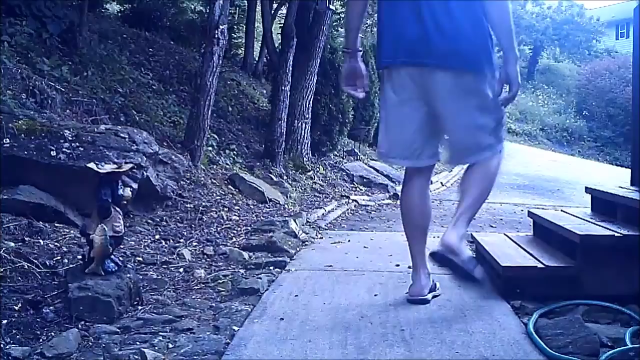

In [221]:
def getFilter(img, filter):
  if filter == "closing":
    return cv2.morphologyEx(img, cv2.MORPH_CLOSE, getKernel("closing"), iterations=2)
  elif filter == "opening":
    return cv2.morphologyEx(img, cv2.MORPH_OPEN, getKernel("opening"), iterations=2)
  elif filter == "dilation":
    return cv2.dilate(img, getKernel("dilation"), iterations=2)
  elif filter == "erosion":
    closing = cv2.morphologyEx(img, cv2.MORPH_CLOSE, getKernel("closing"), iterations=2)
    opening = cv2.morphologyEx(closing, cv2.MORPH_OPEN, getKernel("opening"), iterations=2)
    return cv2.dilate(opening, getKernel("dilation"), iterations=2)
  else:
    raise ValueError("Invalid filter type")
  return img

video = cv2.VideoCapture(path_video)
ret, frame = video.read()
frame = cv2.resize(frame, (0, 0), fx=0.5, fy=0.5)
cv2_imshow(getFilter(frame, "dilation")), cv2_imshow(frame);

In [222]:
def getBGSubtractor(BGS_TYPE):
  if BGS_TYPE == "GMG":
    sub = cv2.bgsegm.createBackgroundSubtractorGMG(initializationFrames=120)
  elif BGS_TYPE == "MOG":
    sub = cv2.bgsegm.createBackgroundSubtractorMOG()
  elif BGS_TYPE == "MOG2":
    sub = cv2.createBackgroundSubtractorMOG2()
  elif BGS_TYPE == "KNN":
    sub = cv2.createBackgroundSubtractorKNN()
  elif BGS_TYPE == "CNT":
    sub = cv2.bgsegm.createBackgroundSubtractorCNT()
  else:
    raise ValueError("Invalid BGS type")
  return sub


In [223]:
forcc = cv2.VideoWriter_fourcc(*'MP4V')

video = cv2.VideoCapture(path_video)
ok, frame = video.read()
frame = cv2.resize(frame, (0, 0), fx=0.5, fy=0.5)

videos_paths = [f"{nameSubtra}.mp4" for nameSubtra in BGS_types]
subs = [getBGSubtractor(bgs_type) for bgs_type in BGS_types]

out = cv2.VideoWriter('Original.mp4', forcc, 20.0, (frame.shape[1], frame.shape[0]), isColor=True)
outs = [cv2.VideoWriter(path, forcc, 20.0, (frame.shape[1], frame.shape[0]), isColor=False) for path in videos_paths]

In [224]:
videos_paths, subs

(['GMG.mp4', 'MOG.mp4', 'MOG2.mp4', 'KNN.mp4', 'CNT.mp4'],
 [< cv2.bgsegm.BackgroundSubtractorGMG 0x7fa94c777450>,
  < cv2.bgsegm.BackgroundSubtractorMOG 0x7fa88cbd3910>,
  < cv2.BackgroundSubtractorMOG2 0x7fa88cbd2f70>,
  < cv2.BackgroundSubtractorKNN 0x7fa88cbd2510>,
  < cv2.bgsegm.BackgroundSubtractorCNT 0x7fa88cbd2430>])

In [225]:
duracao_do_video_segundos = 15 #@param
frames_to_show = int(video.get(cv2.CAP_PROP_FPS)) * duracao_do_video_segundos

In [226]:
video = cv2.VideoCapture(path_video)
min_area = 250

if not video.isOpened():
  raise Exception("Error opening video file")

frame_count = 0
while video.isOpened() and frame_count < frames_to_show:
  ret, frame = video.read()
  if not ret:
    break

  ret, frame = video.read()
  frame = cv2.resize(frame, (0, 0), fx=0.5, fy=0.5)

  for name, sub, out_t in zip(BGS_types, subs, outs):
    mask = sub.apply(frame)
    mask = getFilter(mask, "erosion")
    mask = cv2.putText(mask, f"Subtract: {name}", (10, 30), FONT, 1, TEXT_COLOR, 2, cv2.LINE_AA)
    out_t.write(mask)

  out.write(frame)
  frame_count += 1

for out_t in outs:
  out_t.release()
out.release()
video.release()

In [227]:
show_videos_side_by_side(*videos_paths, 'Original.mp4', otimized=True, tempo_max=duracao_do_video_segundos);

# Detectando o movimento

In [233]:
BGS_usings = ["KNN", "MOG2"]

In [240]:
video = cv2.VideoCapture(path_video)
ok, frame = video.read()
frame = cv2.resize(frame, (0, 0), fx=0.5, fy=0.5)

videos_paths = [f"Result_{nameSubtra}.mp4" for nameSubtra in BGS_usings]
subs = [getBGSubtractor(bgs_type) for bgs_type in BGS_usings]

out = cv2.VideoWriter('Original.mp4', forcc, 20.0, (frame.shape[1], frame.shape[0]), isColor=True)
outs = [cv2.VideoWriter(path, forcc, 20.0, (frame.shape[1], frame.shape[0]), isColor=True) for path in videos_paths]

colors = [(randint(0, 255), randint(0, 255), randint(0, 255)) for _ in range(len(BGS_usings))]

duracao_do_video_segundos = 30 #@param
frames_to_show = int(video.get(cv2.CAP_PROP_FPS)) * duracao_do_video_segundos

In [241]:
video = cv2.VideoCapture(path_video)
min_area = 250

if not video.isOpened():
  raise Exception("Error opening video file")

frame_count = 0
while video.isOpened() and frame_count < frames_to_show:
  ret, frame = video.read()
  if not ret:
    break

  ret, frame = video.read()
  frame = cv2.resize(frame, (0, 0), fx=0.5, fy=0.5)
  frame_copy = frame.copy()

  detect = False
  for name, sub, out_t, color in zip(BGS_usings, subs, outs, colors):
    mask = sub.apply(frame_copy)
    mask = getFilter(mask, "erosion")
    mask = cv2.medianBlur(mask, 5)
    (contours, _) = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    for contour in contours:
      area = cv2.contourArea(contour)
      if area >= min_area:
        detect = True
        (x, y, w, h) = cv2.boundingRect(contour)
        cv2.drawContours(frame, [contour], -1, color, 2)
        cv2.rectangle(frame, (x, y), (x + w, y + h), color, 2)

    _, mask = cv2.threshold(mask, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    result = cv2.bitwise_and(frame , frame, mask=mask)
    result = cv2.putText(result, f"Subtract: {name}", (10, 30), FONT, 1, color, 2, cv2.LINE_AA)
    out_t.write(result)

  out.write(frame)
  frame_count += 1

for out_t in outs:
  out_t.release()
out.release()
video.release()

In [245]:
show_videos_side_by_side(*videos_paths, 'Original.mp4', tempo_max=duracao_do_video_segundos)